In [26]:
# Importar librerías
import pandas as pd
import plotly.express as px
import nltk
from wordcloud import WordCloud
import matplotlib.pyplot as plt
from nltk.corpus import stopwords
import re
import numpy as np
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report

nltk.download('punkt', force=True)
nltk.download('stopwords')



[nltk_data] Downloading package punkt to
[nltk_data]     C:\Users\marco\AppData\Roaming\nltk_data...
[nltk_data]   Unzipping tokenizers\punkt.zip.
[nltk_data] Downloading package stopwords to
[nltk_data]     C:\Users\marco\AppData\Roaming\nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


True

In [12]:
def crear_nube(df, col):
    text = ' '.join(df[col].dropna().values)

    # Eliminar caracteres especiales y convertir a minúsculas manualmente
    tokens = re.findall(r'\b\w+\b', text.lower())  # Tokenización manual con expresiones regulares

    # Eliminar stopwords usando NLTK
    stop_words = set(stopwords.words('english'))  # Puedes cambiar a 'spanish' si lo necesitas
    filtered_tokens = [word for word in tokens if word.isalnum() and word not in stop_words]

    # Unir las palabras filtradas en una sola cadena
    filtered_text = ' '.join(filtered_tokens)

    # Generar la nube de palabras
    wordCloud = WordCloud(width=800, height=400, background_color='black', colormap='viridis').generate(filtered_text)

    # Mostrar la nube de palabras
    plt.figure(figsize=(10, 5))
    plt.imshow(wordCloud, interpolation='bilinear')
    plt.axis('off')  # Quitamos los ejes
    plt.show()
 

In [32]:
url = 'https://media.githubusercontent.com/media/cdtoruno/review-csv/refs/heads/main/Reviews.csv' # Le robamos a carlos chiquito su repo
df = pd.read_csv(url)
df.head()

,Id,ProductId,UserId,ProfileName,HelpfulnessNumerator,HelpfulnessDenominator,Score,Time,Summary,Text
0,1,B001E4KFG0,A3SGXH7AUHU8GW,delmartian,1,1,5,1303862400,Good Quality Dog Food,I have bought several of the Vitality canned d...
1,2,B00813GRG4,A1D87F6ZCVE5NK,dll pa,0,0,1,1346976000,Not as Advertised,Product arrived labeled as Jumbo Salted Peanut...
2,3,B000LQOCH0,ABXLMWJIXXAIN,"Natalia Corres ""Natalia Corres""",1,1,4,1219017600,"""Delight"" says it all",This is a confection that has been around a fe...
3,4,B000UA0QIQ,A395BORC6FGVXV,Karl,3,3,2,1307923200,Cough Medicine,If you are looking for the secret ingredient i...
4,5,B006K2ZZ7K,A1UQRSCLF8GW1T,"Michael D. Bigham ""M. Wassir""",0,0,5,1350777600,Great taffy,Great taffy at a great price. There was a wid...


In [4]:
fig = px.histogram(df, x='Score', title='Distribution of Scores')
fig.show()

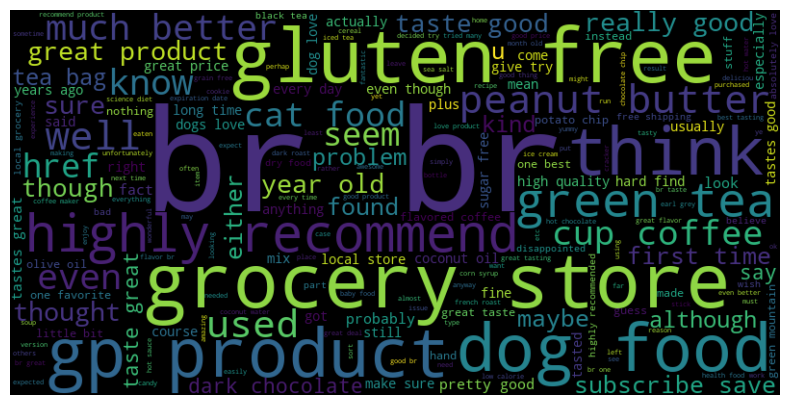

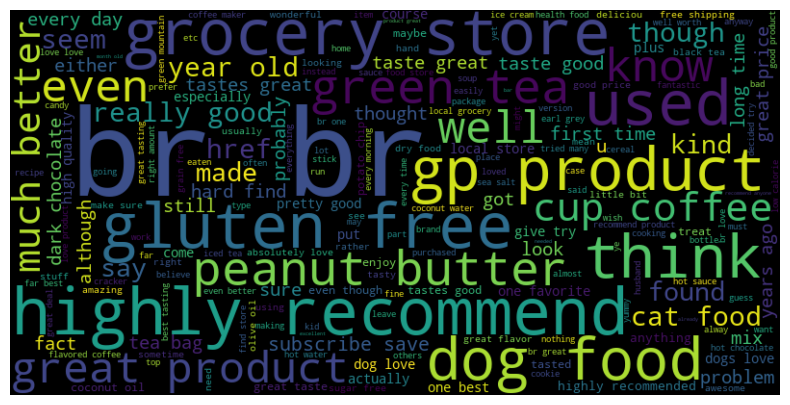

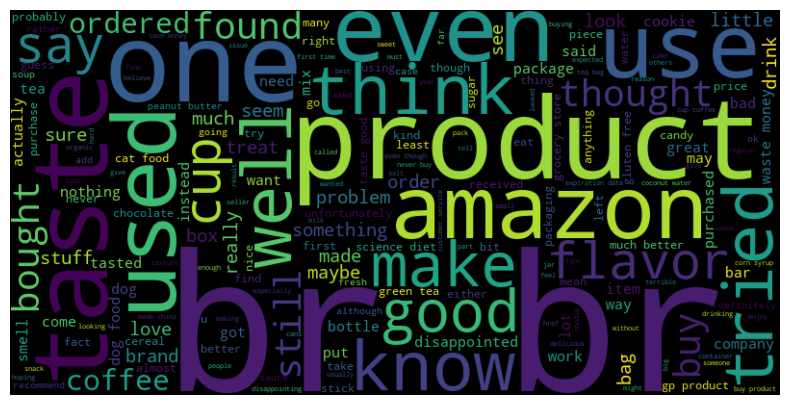

In [29]:
# Pasos 2 3 y 4
df['Sentiment'] = np.where(df['Score'] > 3, 1, np.where(df['Score'] < 3, -1, 0))

df_positive = df[df['Sentiment'] == 1]
df_negative = df[df['Sentiment'] == -1]
crear_nube(df, 'Text')
crear_nube(df_positive, 'Text')
crear_nube(df_negative, 'Text')

df_not_neutral = df[df['Sentiment'] != 0].copy()
fig = px.histogram(df_not_neutral, x='Sentiment', title='Distribution of Sentiments')
fig.show()


In [31]:
# Paso 5
df_not_neutral['Summary'] = df_not_neutral['Summary'].copy().fillna('').astype(str)
df_not_neutral['Summary'] = df_not_neutral['Summary'].copy().apply(lambda x: re.sub(r'[^\w\s]','', x))

df_final = df_not_neutral[['Summary', 'Sentiment']]

df_training = df_final.sample(frac=0.8, random_state=2024)
df_test = df_final.drop(df_training.index)

vectorizer = CountVectorizer()
x_training = vectorizer.fit_transform(df_training['Summary'])
x_test = vectorizer.transform(df_test['Summary'])
y_training = df_training['Sentiment']
y_test = df_test['Sentiment']

model = LogisticRegression(max_iter=1000)
model.fit(x_training, y_training)

# Hacer predicciones
y_pred = model.predict(x_test)

# Paso 6
# Evaluar el modelo
print(f"Accuracy: {accuracy_score(y_test, y_pred)}")
print("Confusion Matrix:")
print(confusion_matrix(y_test, y_pred))

class_report = classification_report(y_test, y_pred)
print("Classification Report:")
print(class_report)



Accuracy: 0.9258864809866588
Confusion Matrix:
[[10836  5601]
 [ 2193 86533]]
Classification Report:
              precision    recall  f1-score   support

          -1       0.83      0.66      0.74     16437
           1       0.94      0.98      0.96     88726

    accuracy                           0.93    105163
   macro avg       0.89      0.82      0.85    105163
weighted avg       0.92      0.93      0.92    105163

